# Basic D-Wave usage

In this notebook you will learn how to:

    - Query the D-Wave solvers available to your account
    - Embed a QUBO problem, submit it to a solver and inspect the results
    - Inspect the qubit connectivity of a QPU
    - Submit the same QUBO problem as above, but with manual instead of automatic embedding
    - Learn about the five-dimensional Pegasus coordinate system to identify the position of individual qubits on the chip
    - Learn about the five-dimensional Zephyr coordinate system (Advantage2) to identify the position of individual qubits on the chip

## Initialization

In [1]:
import dwave
import dwave.inspector
from dwave.system import DWaveSampler, EmbeddingComposite
from dwave.cloud import Client
import networkx as nx
import dwave_networkx as dnx
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
client = Client.from_config(profile='defaults')
client.get_solvers()

[StructuredSolver(id='c4-sw_optimize'),
 StructuredSolver(id='c4-sw_sample'),
 StructuredSolver(id='DW_2000Q_6'),
 StructuredSolver(id='DW_2000Q_VFYC_6'),
 BQMSolver(id='hybrid_binary_quadratic_model_version2'),
 DQMSolver(id='hybrid_discrete_quadratic_model_version1'),
 CQMSolver(id='hybrid_constrained_quadratic_model_version1p'),
 StructuredSolver(id='Advantage2_prototype1.1'),
 StructuredSolver(id='Advantage_system6.1'),
 StructuredSolver(id='Advantage_system4.1')]

In [3]:
client = Client.from_config(profile='defaults', region='eu-central-1')
client.get_solvers()

[StructuredSolver(id='Advantage_system5.3')]

## Solve a QUBO problem with embedding

In [4]:
qubo = {
    (0,0): -1,
    (1,1): -0.5,
    (0,1): 2,
}
sampler = EmbeddingComposite(DWaveSampler(profile='defaults', solver='Advantage_system4.1'))  # can replace solver by any other solver above (need to use region='eu-central-1' for the D-Wave systems in Jülich)
results = sampler.sample_qubo(qubo, num_reads=100)
results.to_pandas_dataframe()

# dwave.inspector.show(results)  # is expected to be working soon

,0,1,chain_break_fraction,energy,num_occurrences
0,1,0,0.0,-1.0,97
1,0,1,0.0,-0.5,3


## Solve a QUBO problem without embedding

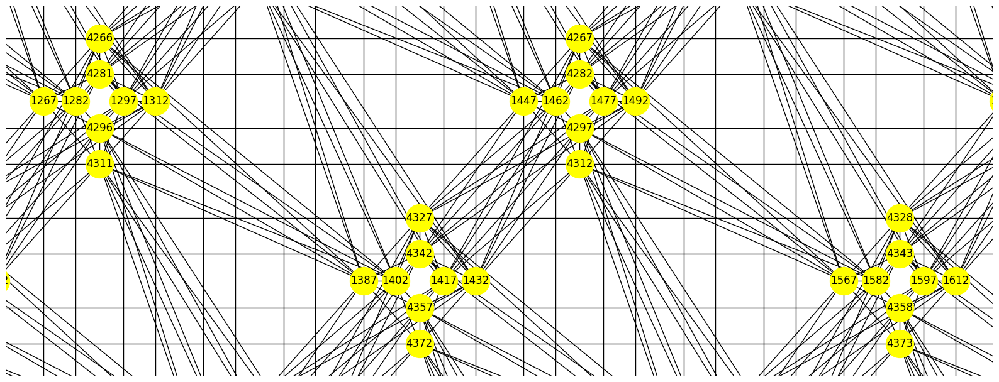

In [5]:
plt.figure(figsize=(16,6))
G = dnx.pegasus_graph(16)
dnx.draw_pegasus(G, with_labels=True, crosses=True, node_color="Yellow", node_size=1000)
plt.margins(x=-0.44, y=-0.48)  # zoom into the graph

In [6]:
qubo = {
    (1387,4327): -1,
    (4327,4327): -0.5,
    (1387,4327): 2,
}
sampler = DWaveSampler(profile='defaults', solver='Advantage_system4.1')  # can replace solver by any other solver above (need to use region='eu-central-1' for the D-Wave systems in Jülich)
results = sampler.sample_qubo(qubo, num_reads=100)
results.to_pandas_dataframe()

,1387,4327,energy,num_occurrences
0,0,1,-0.5,95
1,0,0,0.0,1
2,1,0,0.0,4


# Pegasus coordinate system

In [7]:
pegasus_coords = dnx.pegasus_coordinates(16)  # there are also Chimera coordinates (for DW2000Q: dnx.chimera_coordinates(16,16,4)) or Zephyr coordinates

We can translate the linear physical qubit indices `q` above into a five-dimensional Pegasus coordinate system (that is compatible with Chimera too):

```
t, y, x, u, k = pegasus_coords.linear_to_nice(q)
```

In [8]:
pegasus_coords.linear_to_nice(1387)

(1, 7, 7, 0, 0)

In [9]:
pegasus_coords.linear_to_nice(4327)

(1, 7, 7, 1, 0)

In [10]:
pegasus_coords.linear_to_nice(346)

(1, 1, 1, 0, 3)

The Pegasus coordinates `(t,y,x,u,k)` enumerate the full Pegasus topology in the following way:

- `t`: depth index of the three 8-qubit Chimera crosses within one unit cell (`t=0,1,2`)
- `y`: vertical unit cell index
- `x`: horizontal unit cell index
- `u`: denotes the horizontal (`u=0`) or vertical (`u=1`) 4 qubits withing an 8-qubit Chimera cross
- `k`: enumerates the four qubits within this part of the Chimera cross (`k=0,1,2,3`)

Note that the Pegasus coordinates can be easily related to Chimera coordinates `(y,x,u,k)`. In this context, the five-dimensional Pegasus coordinates only have the additional `t` dimension (`t=0,1,2`). The corresponding functions `chimera_coords.linear_to_chimera(q)` and `chimera_coords.chimera_to_linear(y,x,u,k)` from `chimera_coords = dnx.chimera_coordinates(16,16,4)` can be used for this purpose.

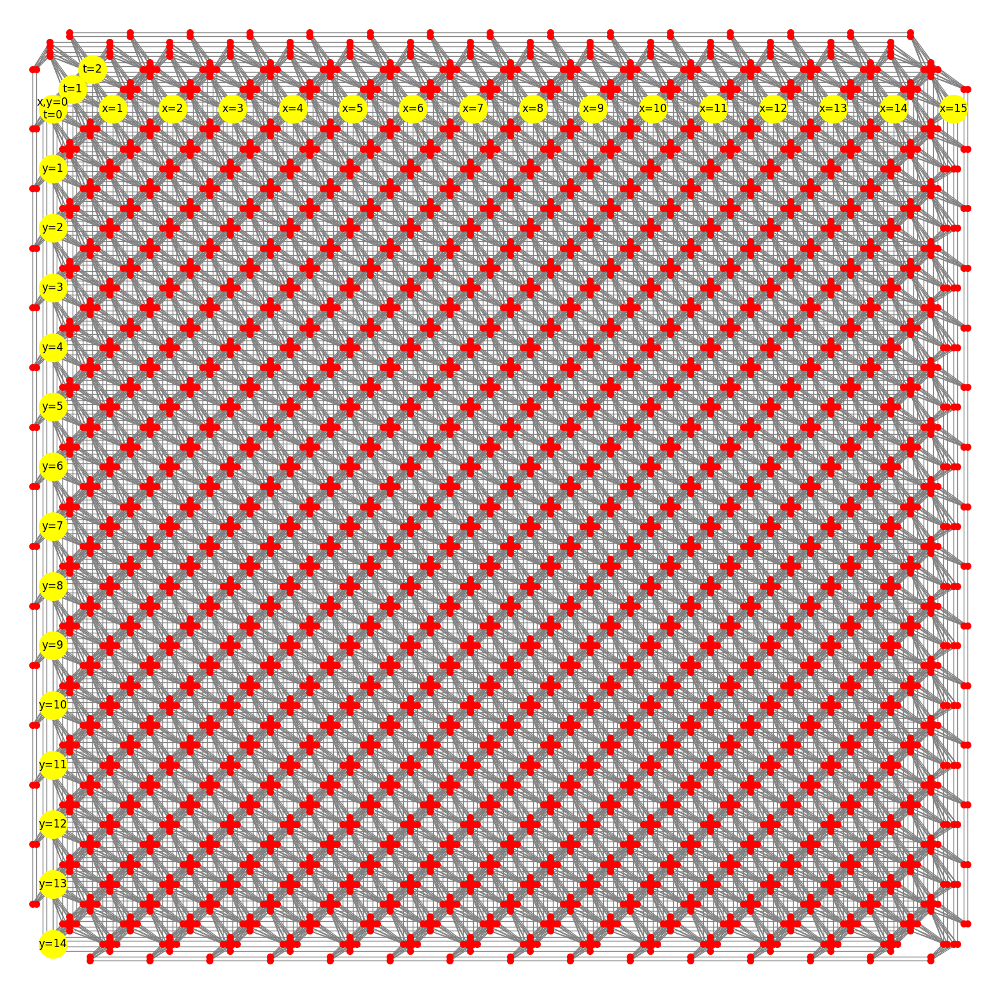

In [11]:
qubit_labels = {
    pegasus_coords.nice_to_linear((0, 0, 0, 0, 2)): 'x,y=0\nt=0',
    pegasus_coords.nice_to_linear((1, 0, 0, 0, 2)): 't=1',
    pegasus_coords.nice_to_linear((2, 0, 0, 0, 2)): 't=2',
}
qubit_labels.update({
    pegasus_coords.nice_to_linear((0, 0, x, 0, 2)): f'x={x}' for x in range(1,16)
})
qubit_labels.update({
    pegasus_coords.nice_to_linear((0, y, 0, 0, 2)): f'y={y}' for y in range(1,15)
})

fig,ax = plt.subplots(1, 1, figsize=(20,20))
dnx.draw_pegasus(dnx.pegasus_graph(16), ax=ax, crosses=True, node_size=50, node_color='red', edge_color='gray')
dnx.draw_pegasus(dnx.pegasus_graph(16, node_list=qubit_labels), labels=qubit_labels, ax=ax, crosses=True, node_size=1000, node_color='yellow', edge_color='gray')
plt.margins(x=-0.02, y=-0.02)

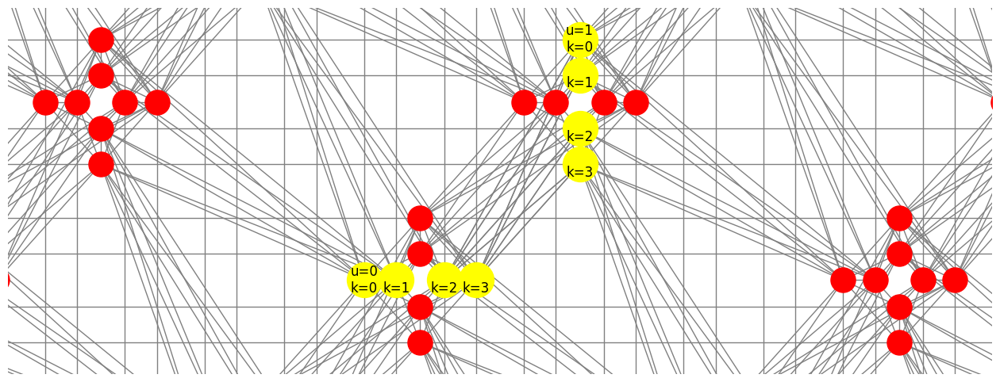

In [12]:
qubit_labels = {
    pegasus_coords.nice_to_linear((1, 7, 7, 0, 0)): 'u=0\nk=0',
    pegasus_coords.nice_to_linear((1, 7, 7, 0, 1)): '\nk=1',
    pegasus_coords.nice_to_linear((1, 7, 7, 0, 2)): '\nk=2',
    pegasus_coords.nice_to_linear((1, 7, 7, 0, 3)): '\nk=3',
    pegasus_coords.nice_to_linear((2, 7, 7, 1, 0)): 'u=1\nk=0',
    pegasus_coords.nice_to_linear((2, 7, 7, 1, 1)): '\nk=1',
    pegasus_coords.nice_to_linear((2, 7, 7, 1, 2)): '\nk=2',
    pegasus_coords.nice_to_linear((2, 7, 7, 1, 3)): '\nk=3',
}

fig,ax = plt.subplots(figsize=(16,6))
dnx.draw_pegasus(dnx.pegasus_graph(16), ax=ax, crosses=True, node_size=500, node_color='red', edge_color='gray')
dnx.draw_pegasus(dnx.pegasus_graph(16, node_list=qubit_labels), labels=qubit_labels, ax=ax, crosses=True, node_size=1000, node_color='yellow', edge_color='gray')
plt.margins(x=-0.44, y=-0.48)

# Zephyr coordinate system

In [3]:
zephyr_coords = dnx.zephyr_coordinates(4)

We can translate the linear physical qubit indices `q` above into a five-dimensional Zephyr (m=4, t=4) coordinate system:

```
u, w, k, j, z = zephyr_coords.linear_to_zephyr(q)
```

In [8]:
zephyr_coords.linear_to_zephyr(52)

(0, 1, 2, 1, 0)

The Zephyr coordinates `(u,w,k,j,z)` enumerate the Zephyr topology in the following way:

    * u: qubit orientation (0 = vertical, 1 = horizontal)
    * w: orthogonal major offset; 0 <= w < 2m+1
    * k: orthogonal secondary offset; 0 <= k < t
    * j: orthogonal minor offset; 0 <= j < 2
    * z: parallel offset; 0 <= z < m

Zephyr coordinates: (u,w,k,j,z)


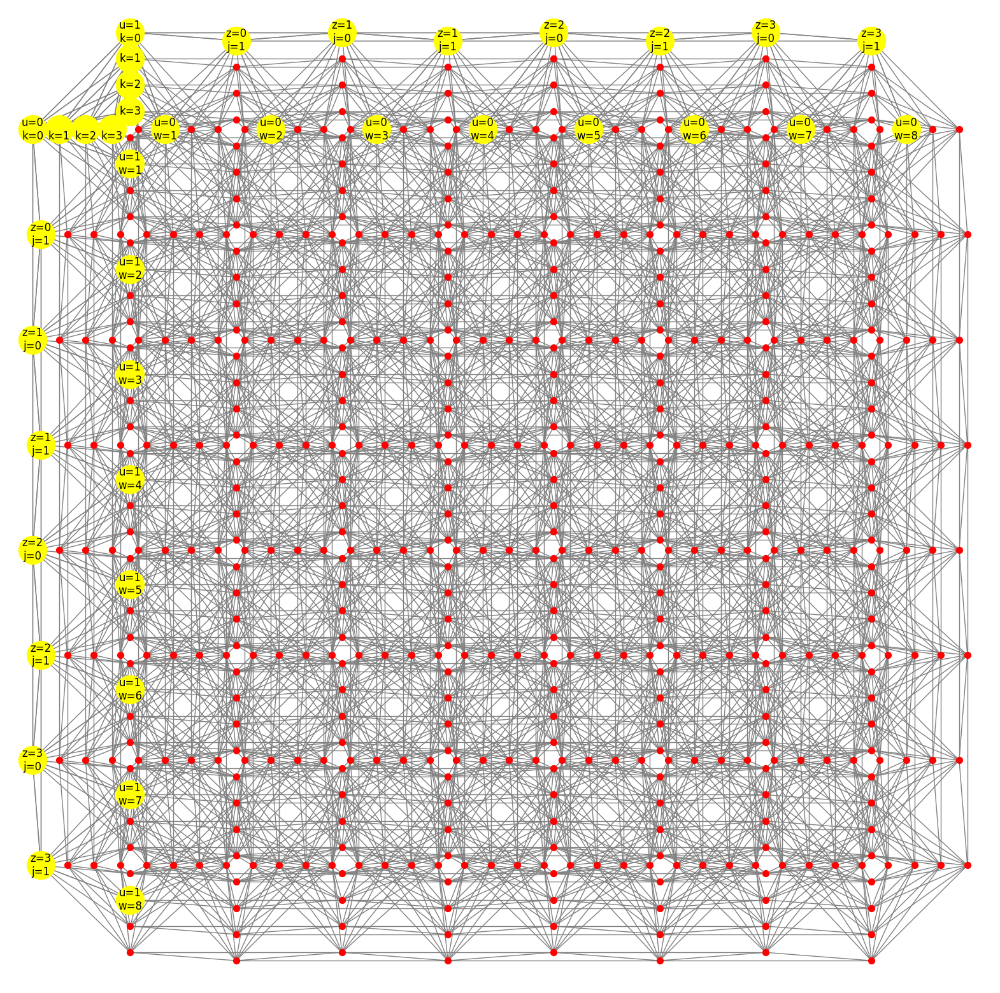

In [10]:
qubit_labels = {
    zephyr_coords.zephyr_to_linear((0, 0, 0, 0, 0)): 'u=0\nk=0',
    zephyr_coords.zephyr_to_linear((0, 0, 1, 0, 0)): '\nk=1',
    zephyr_coords.zephyr_to_linear((0, 0, 2, 0, 0)): '\nk=2',
    zephyr_coords.zephyr_to_linear((0, 0, 3, 0, 0)): '\nk=3',
    zephyr_coords.zephyr_to_linear((1, 0, 0, 0, 0)): 'u=1\nk=0',
    zephyr_coords.zephyr_to_linear((1, 0, 1, 0, 0)): 'k=1',
    zephyr_coords.zephyr_to_linear((1, 0, 2, 0, 0)): 'k=2',
    zephyr_coords.zephyr_to_linear((1, 0, 3, 0, 0)): 'k=3',
    zephyr_coords.zephyr_to_linear((0, 1, 1, 0, 0)): 'u=0\nw=1',
    zephyr_coords.zephyr_to_linear((1, 1, 1, 0, 0)): 'u=1\nw=1',
    zephyr_coords.zephyr_to_linear((0, 2, 1, 0, 0)): 'u=0\nw=2',
    zephyr_coords.zephyr_to_linear((1, 2, 1, 0, 0)): 'u=1\nw=2',
    zephyr_coords.zephyr_to_linear((0, 3, 1, 0, 0)): 'u=0\nw=3',
    zephyr_coords.zephyr_to_linear((1, 3, 1, 0, 0)): 'u=1\nw=3',
    zephyr_coords.zephyr_to_linear((0, 4, 1, 0, 0)): 'u=0\nw=4',
    zephyr_coords.zephyr_to_linear((1, 4, 1, 0, 0)): 'u=1\nw=4',
    zephyr_coords.zephyr_to_linear((0, 5, 1, 0, 0)): 'u=0\nw=5',
    zephyr_coords.zephyr_to_linear((1, 5, 1, 0, 0)): 'u=1\nw=5',
    zephyr_coords.zephyr_to_linear((0, 6, 1, 0, 0)): 'u=0\nw=6',
    zephyr_coords.zephyr_to_linear((1, 6, 1, 0, 0)): 'u=1\nw=6',
    zephyr_coords.zephyr_to_linear((0, 7, 1, 0, 0)): 'u=0\nw=7',
    zephyr_coords.zephyr_to_linear((1, 7, 1, 0, 0)): 'u=1\nw=7',
    zephyr_coords.zephyr_to_linear((0, 8, 1, 0, 0)): 'u=0\nw=8',
    zephyr_coords.zephyr_to_linear((1, 8, 1, 0, 0)): 'u=1\nw=8',
    zephyr_coords.zephyr_to_linear((0, 0, 0, 1, 0)): 'z=0\nj=1',
    zephyr_coords.zephyr_to_linear((1, 0, 0, 1, 0)): 'z=0\nj=1',
    zephyr_coords.zephyr_to_linear((0, 0, 0, 0, 1)): 'z=1\nj=0',
    zephyr_coords.zephyr_to_linear((1, 0, 0, 0, 1)): 'z=1\nj=0',
    zephyr_coords.zephyr_to_linear((0, 0, 0, 1, 1)): 'z=1\nj=1',
    zephyr_coords.zephyr_to_linear((1, 0, 0, 1, 1)): 'z=1\nj=1',
    zephyr_coords.zephyr_to_linear((0, 0, 0, 0, 2)): 'z=2\nj=0',
    zephyr_coords.zephyr_to_linear((1, 0, 0, 0, 2)): 'z=2\nj=0',
    zephyr_coords.zephyr_to_linear((0, 0, 0, 1, 2)): 'z=2\nj=1',
    zephyr_coords.zephyr_to_linear((1, 0, 0, 1, 2)): 'z=2\nj=1',
    zephyr_coords.zephyr_to_linear((0, 0, 0, 0, 3)): 'z=3\nj=0',
    zephyr_coords.zephyr_to_linear((1, 0, 0, 0, 3)): 'z=3\nj=0',
    zephyr_coords.zephyr_to_linear((0, 0, 0, 1, 3)): 'z=3\nj=1',
    zephyr_coords.zephyr_to_linear((1, 0, 0, 1, 3)): 'z=3\nj=1',
}
print('Zephyr coordinates: (u,w,k,j,z)')
fig,ax = plt.subplots(1, 1, figsize=(20,20))
dnx.draw_zephyr(dnx.zephyr_graph(4), ax=ax, node_size=50, node_color='red', edge_color='gray')
dnx.draw_zephyr(dnx.zephyr_graph(4, node_list=qubit_labels), labels=qubit_labels, ax=ax, node_size=1000, node_color='yellow', edge_color='gray')
plt.margins(x=-0.02, y=-0.02)

Zephyr coordinates: (u,w,k,j,z)


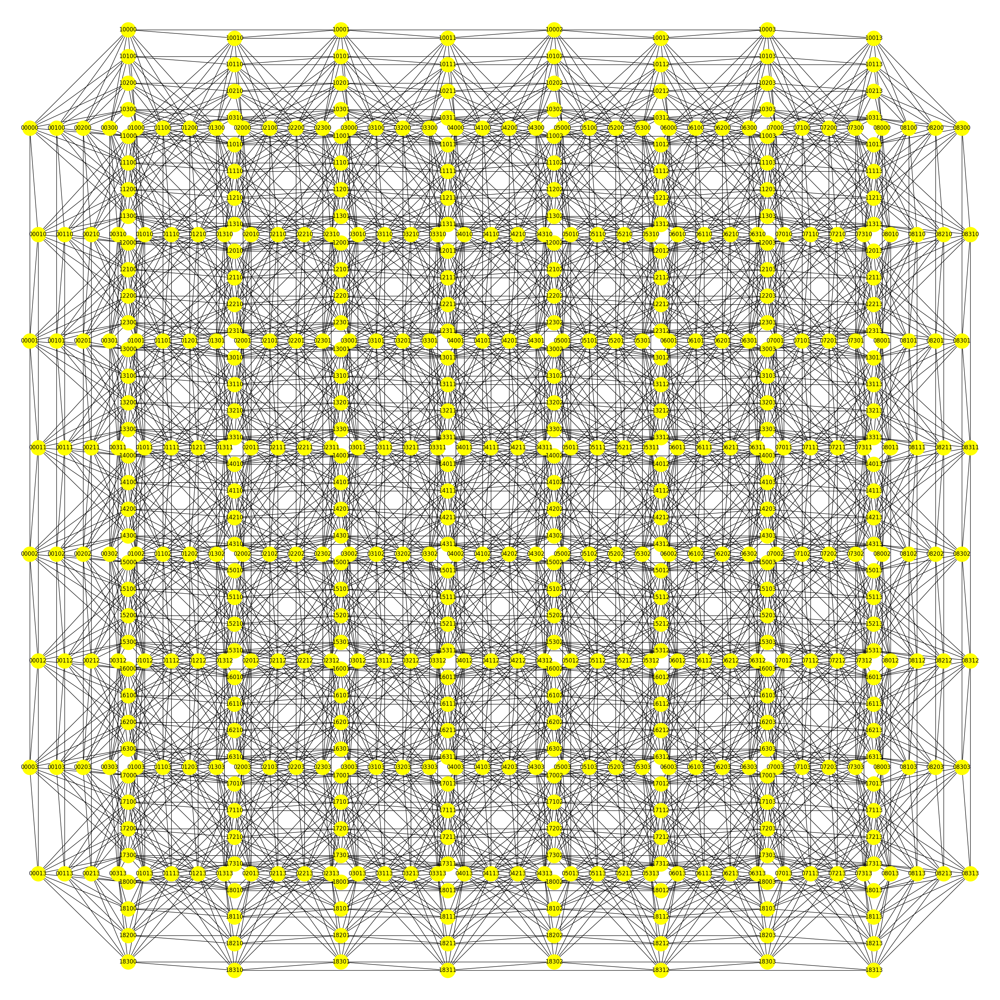

In [9]:
print('Zephyr coordinates: (u,w,k,j,z)')
plt.figure(figsize=(30,30))
G = dnx.zephyr_graph(4)  # t=4 
dnx.draw_zephyr(G, labels={n: ''.join(map(str,dnx.zephyr_coordinates(4).linear_to_zephyr(n))) for n in G.nodes}, node_color="Yellow", node_size=1000)
plt.margins(x=-0.02, y=-0.02)  # zoom into the graph